In [2]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import pandas as pd

from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader
from tqdm import tqdm

from tools.custom_loss import blocky_loss
from tools.preprocessing_script import preprocessing
from tools.utils import get_number_of_parameters, pickle_load, pickle_dump
from tools.models.cnn_models import CNN_3l, CNN_2l, CNN_4l
from tools.models.lstm_models import RNNDeconvolutionRNN
from tools.analysis import plot_predictions, compute_test_metric

from tools.training_functions import train_autoencoder, train
from tools.models.autoencoder_models import AutoEncoder, LatentDeconvolution
from tools.preprocessing_script import get_real_data_split

/home/assaraf/.conda/envs/mip_proj/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
%reload_ext autoreload
%autoreload 2

In [ ]:
emotion = get_real_data_split('emotion', for_test=True)
wm = get_real_data_split('wm', for_test=True)

Preprocessing data as test set:


100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:00<00:00, 143.05it/s]


Preprocessing data as test set:


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 30/30 [00:00<00:00, 78.14it/s]


# Mix datasets

## CNN

In [20]:
mixed_data_results_CNN = pickle_load('final_models/mixed_models_CNN_4L.pkl')
output_dict_CNN = mixed_data_results_CNN['output_dict']
models_dict_CNN = mixed_data_results_CNN['models_dict']

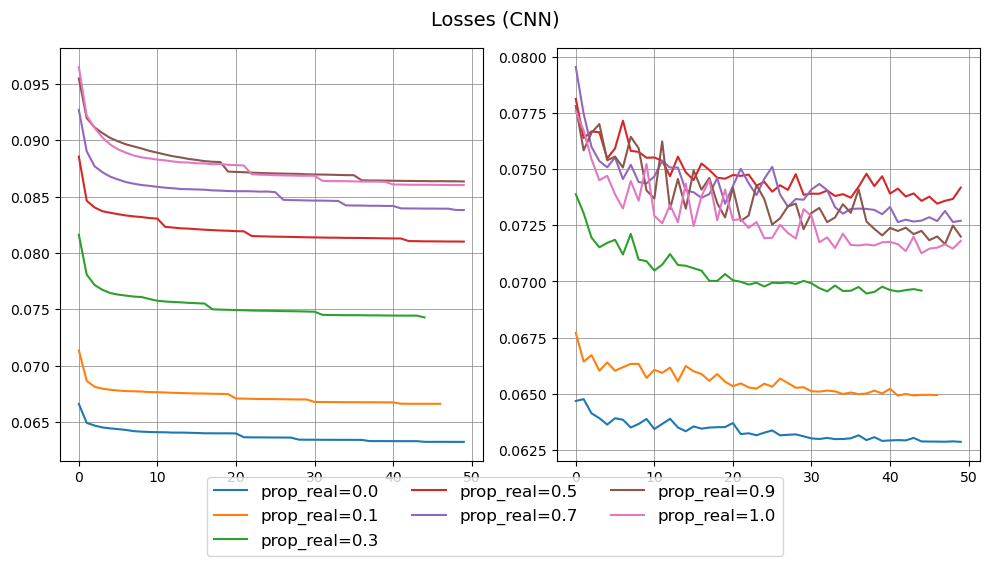

In [21]:
f, ax = plt.subplots(1, 2, figsize=(10, 5))
for key, val in output_dict_CNN.items():

    ax[0].plot(val['train_loss'], label=f'prop_real={key}')
    ax[0].grid(True, color='gray', linestyle='-', linewidth=0.5)

    ax[1].plot(val['val_loss'], label=f'prop_real={key}')
    ax[1].grid(True, color='gray', linestyle='-', linewidth=0.5)

f.suptitle('Losses (CNN)', fontsize=14)
handles, labels = ax[0].get_legend_handles_labels()
f.legend(handles, labels, loc='lower center', fontsize=12, ncol=3, bbox_to_anchor=(0.5, -0.13))
f.tight_layout()
plt.show()

In [22]:
from tools.analysis import test_model
import pandas as pd
from tqdm import tqdm

real_data = torch.load('datasets/real_data_MGL_000000.pt')
sim_data = torch.load('datasets/simulated_data_aliceO2_300m.pt')
test_loader_real = DataLoader(real_data['test'])
test_loader_sim = DataLoader(sim_data['test'])

test_mse_dict = {'prop_real': [], 'mse_real': [], 'var_real': [], 'mse_sim': [], 'var_sim': []}
for prop_real, model in tqdm(models_dict_CNN.items()):

    mse_real, var_real = test_model(test_loader_real, model)
    mse_sim, var_sim = test_model(test_loader_sim, model)

    test_mse_dict['prop_real'].append(prop_real)
    test_mse_dict['mse_real'].append(mse_real)
    test_mse_dict['var_real'].append(var_real)
    test_mse_dict['mse_sim'].append(mse_sim)
    test_mse_dict['var_sim'].append(var_sim)

test_mse_df_CNN = pd.DataFrame(test_mse_dict)

100%|█████████████████████████████████████████████| 7/7 [08:59<00:00, 77.13s/it]


Text(0.5, 1.0, 'MSE on test set (CNN)')

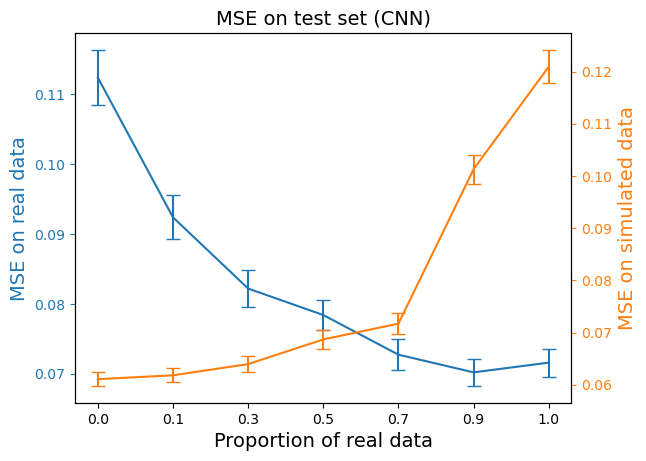

In [23]:
f, ax = plt.subplots()

ax2 = ax.twinx()
ax.errorbar(test_mse_df_CNN.prop_real, test_mse_df_CNN.mse_real, yerr=test_mse_df_CNN.var_real, capsize=5, label='real data', c='tab:blue')
ax.set_ylabel('MSE on real data', fontsize=14)
ax.yaxis.label.set_color('tab:blue')
ax.tick_params(axis='y', colors='tab:blue')

ax2.errorbar(test_mse_df_CNN.prop_real, test_mse_df_CNN.mse_sim, yerr=test_mse_df_CNN.var_sim, capsize=5, label='simulated data', c='tab:orange')
ax2.set_ylabel('MSE on simulated data', fontsize=14)
ax2.yaxis.label.set_color('tab:orange')
ax2.tick_params(axis='y', colors='tab:orange')

ax.set_xlabel('Proportion of real data', fontsize=14)
ax.set_title('MSE on test set (CNN)', fontsize=14)

In [24]:
models_dict_CNN_forinferenceplot = {
    key: [f'AE | prop_real = {key}', model] for key, model in models_dict_CNN.items()
}

Text(0.5, 0.98, 'Inference on simulated data')

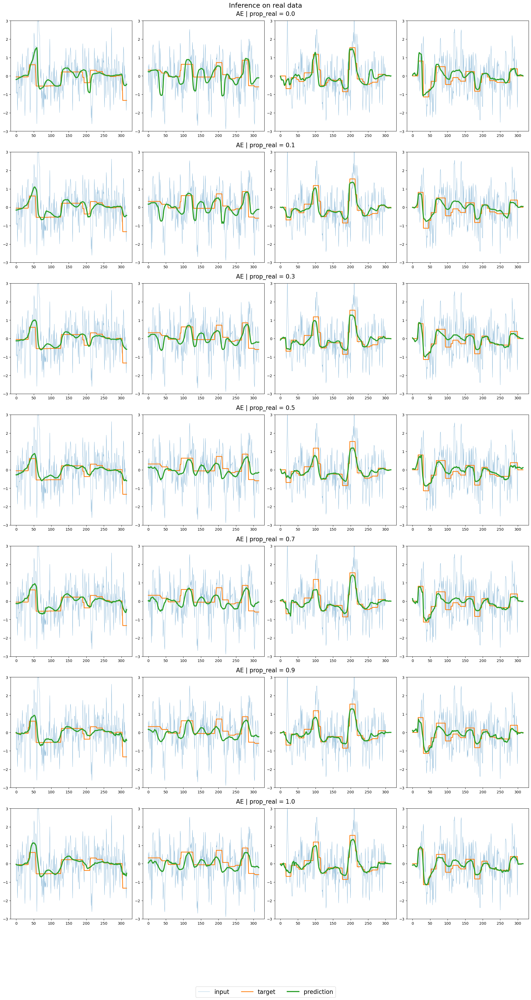

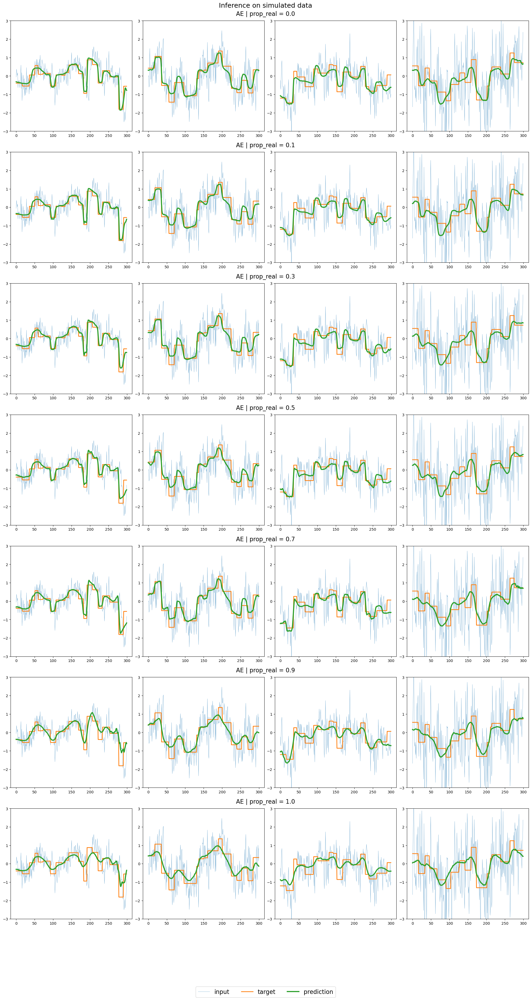

In [25]:
from tools.analysis import plot_predictions

f_real = plot_predictions(models_dict_CNN_forinferenceplot, real_data['test'])
f_real.suptitle('Inference on real data', fontsize=18)

f_sim = plot_predictions(models_dict_CNN_forinferenceplot, sim_data['test'])
f_sim.suptitle('Inference on simulated data', fontsize=18)

## AE

In [26]:
mixed_data_results_AE = pickle_load('final_models/mixed_models_AutoEncoderDeconvolution.pkl')
output_dict_AE = mixed_data_results_AE['output_dict']
models_dict_AE = mixed_data_results_AE['models_dict']

In [34]:
sim_data['test'][0][0].shape

torch.Size([300])

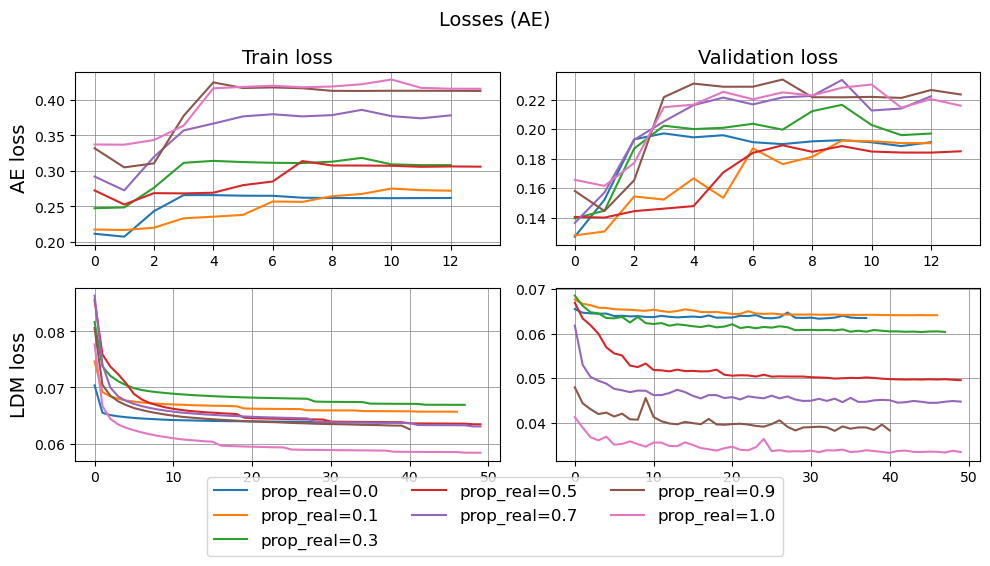

In [7]:
f, ax = plt.subplots(2, 2, figsize=(10, 5))
for key, val in output_dict_AE.items():

    ax[0, 0].plot(val['train_loss']['ae'], label=f'prop_real={key}')
    ax[1, 0].plot(val['train_loss']['ldm'], label=f'prop_real={key}')

    ax[0, 1].plot(val['val_loss']['ae'], label=f'prop_real={key}')
    ax[1, 1].plot(val['val_loss']['ldm'], label=f'prop_real={key}')

for a in ax.flatten():
    a.grid(True, color='gray', linestyle='-', linewidth=0.5)
ax[0, 0].set_title('Train loss', fontsize=14)
ax[0, 1].set_title('Validation loss', fontsize=14)
ax[0, 0].set_ylabel('AE loss', fontsize=14)
ax[1, 0].set_ylabel('LDM loss', fontsize=14)
f.suptitle('Losses (AE)', fontsize=14)

handles, labels = ax[0, 0].get_legend_handles_labels()
f.legend(handles, labels, loc='lower center', fontsize=12, ncol=3, bbox_to_anchor=(0.5, -0.13))
f.tight_layout()
plt.show()

In [12]:
from tools.analysis import test_model
import pandas as pd
from tqdm import tqdm

real_data = torch.load('datasets/real_data_MGL_000000.pt')
sim_data = torch.load('datasets/simulated_data_aliceO2_300m.pt')
test_loader_real = DataLoader(real_data['test'])
test_loader_sim = DataLoader(sim_data['test'])

test_mse_dict = {'prop_real': [], 'mse_real': [], 'var_real': [], 'mse_sim': [], 'var_sim': []}
for prop_real, model in tqdm(models_dict_AE.items()):

    mse_real, var_real = test_model(test_loader_real, model)
    mse_sim, var_sim = test_model(test_loader_sim, model)

    test_mse_dict['prop_real'].append(prop_real)
    test_mse_dict['mse_real'].append(mse_real)
    test_mse_dict['var_real'].append(var_real)
    test_mse_dict['mse_sim'].append(mse_sim)
    test_mse_dict['var_sim'].append(var_sim)

test_mse_df_AE = pd.DataFrame(test_mse_dict)

100%|████████████████████████████████████████████| 7/7 [14:57<00:00, 128.24s/it]


Text(0.5, 0.98, 'MSE on test sets (AE)')

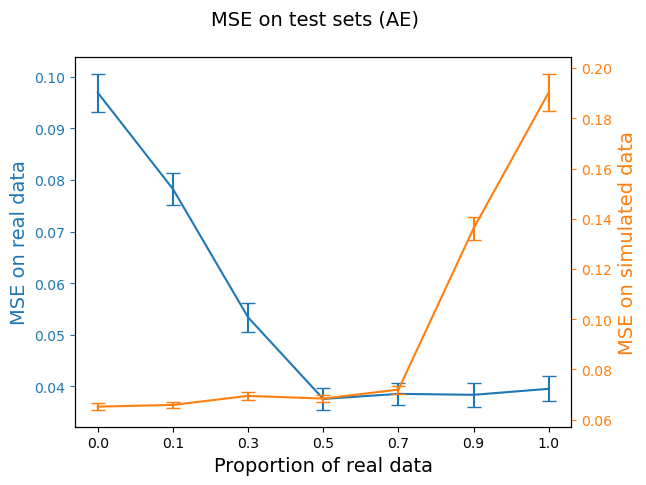

In [13]:
f, ax = plt.subplots()

ax2 = ax.twinx()
ax.errorbar(test_mse_df_AE.prop_real, test_mse_df_AE.mse_real, yerr=test_mse_df_AE.var_real, capsize=5, label='real data', c='tab:blue')
ax.set_ylabel('MSE on real data', fontsize=14)
ax.yaxis.label.set_color('tab:blue')
ax.tick_params(axis='y', colors='tab:blue')

ax2.errorbar(test_mse_df_AE.prop_real, test_mse_df_AE.mse_sim, yerr=test_mse_df_AE.var_sim, capsize=5, label='simulated data', c='tab:orange')
ax2.set_ylabel('MSE on simulated data', fontsize=14)
ax2.yaxis.label.set_color('tab:orange')
ax2.tick_params(axis='y', colors='tab:orange')

ax.set_xlabel('Proportion of real data', fontsize=14)
f.suptitle('MSE on test sets (AE)', fontsize=14)

In [14]:
models_dict_AE_forinferenceplot = {
    key: [f'AE | prop_real = {key}', model] for key, model in models_dict_AE.items()
}

Text(0.5, 0.98, 'Inference on simulated data')

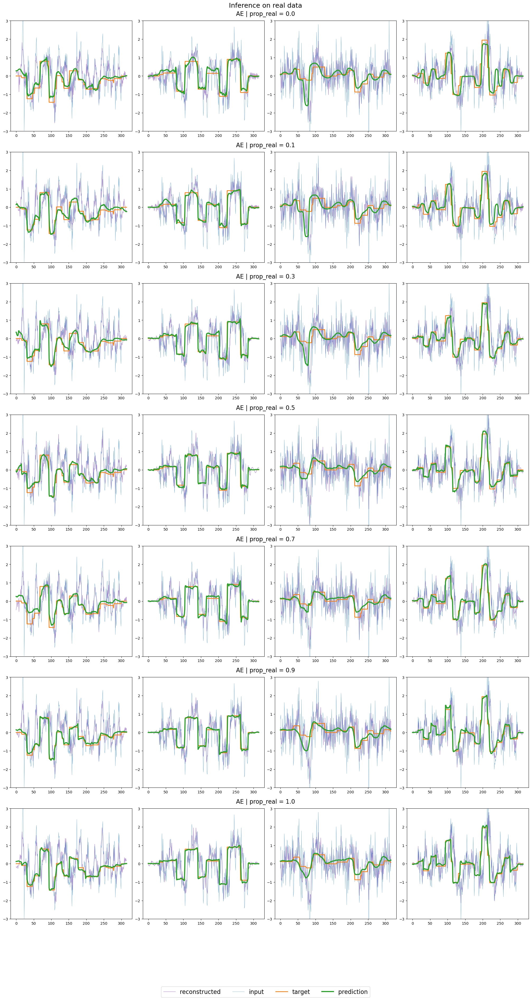

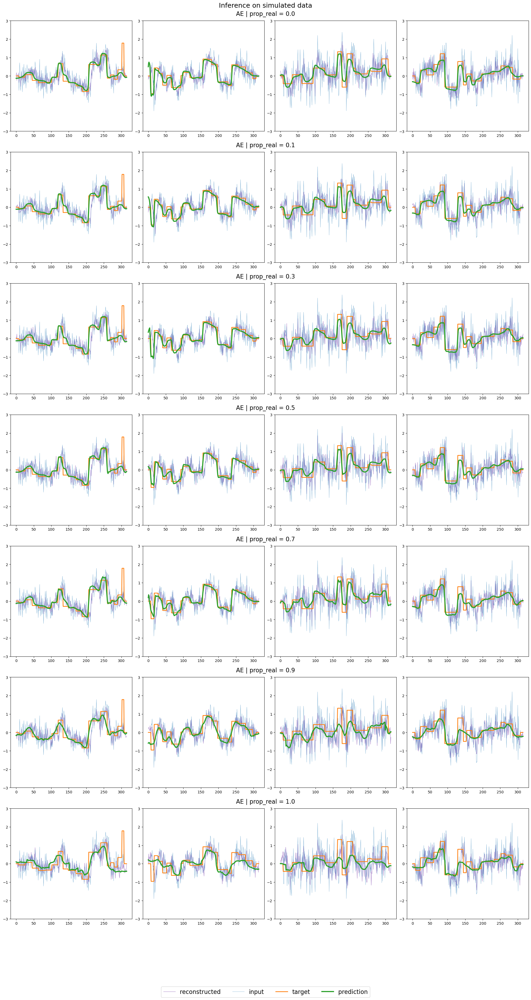

In [36]:
from tools.analysis import plot_predictions

f_real = plot_predictions(models_dict_AE_forinferenceplot, real_data['test'])
f_real.suptitle('Inference on real data', fontsize=18)

f_sim = plot_predictions(models_dict_AE_forinferenceplot, sim_data['test'])
f_sim.suptitle('Inference on simulated data', fontsize=18)

# Corrected models (oversampling = 1)

In [9]:
from tools.analysis import get_best_models_dict, plot_losses_per_model, plot_predictions, test_model

# sim_data = torch.load('datasets/simulated_data_aliceO2_300m.pt')
# real_data = torch.load('datasets/real_data_MGL_080808.pt')

## CNN

In [13]:
def load_winning_cnn_models():
    
    results_df = pd.read_csv(f'csv_logs/cnn_logs_W9.csv')
    results_df.loc[results_df.min_mse_val == results_df.min_mse_val.min()]
    best_models = pd.DataFrame([
        results_df.loc[results_df.study_name.str.contains('ALICEO2')].loc[lambda x: x['min_mse_val'].idxmin()], # Corrected to get the model with correct HRF oversampling
        results_df.loc[results_df.study_name.str.contains('MGL')].loc[lambda x: x['min_mse_val'].idxmin()],
    ])
    best_models_dict = get_best_models_dict(best_models)

    # Print winning models' names
    best_model_keys = list(best_models_dict.keys())
    print('### WINNING CNN MODELS ###\n')
    print(best_models_dict[best_model_keys[0]][0])
    print('\n')
    print(best_models_dict[best_model_keys[1]][0])
    print('\n')

    # Gather winning models
    winning_cnn_models = {
        "real": ['CNN (real)'] + best_models_dict[best_model_keys[1]][1:],
        "simulated": ['CNN (simulated)'] + best_models_dict[best_model_keys[0]][1:]
    }

    return winning_cnn_models

winning_cnn_models = load_winning_cnn_models()

### WINNING CNN MODELS ###

CNN_4L (ALICEO2)
7390 params
(K1=70, K2=30, K3=35, K4=53, F1=9, F2=10, F3=10)
MSE_TV (a=30.0000, l=0.0001)


CNN_4L (MGL)
5797 params
(K1=29, K2=76, K3=79, K4=85, F1=5, F2=6, F3=6)
MSE_TV (a=30.6089, l=0.0000)




In [14]:
winning_cnn_models

{'real': ['CNN (real)',
  CNN_4l(
    (conv1): Conv1d(1, 5, kernel_size=(29,), stride=(1,))
    (conv2): Conv1d(5, 6, kernel_size=(76,), stride=(1,))
    (conv3): Conv1d(6, 6, kernel_size=(79,), stride=(1,))
    (conv4): Conv1d(6, 1, kernel_size=(85,), stride=(1,))
  ),
  {'train_loss': [0.09617700520629496,
    0.0922921153659482,
    0.09094474214213748,
    0.09013684752121279,
    0.08941963441028618,
    0.08896443196548351,
    0.08869957557123173,
    0.08845913126704145,
    0.08831099163665511,
    0.08816238671558946,
    0.08808835119139057,
    0.08800124512340331,
    0.08792885756714862,
    0.08785952294998252,
    0.087839455023934,
    0.08777681189230489,
    0.08775062235615311,
    0.08771871218944721,
    0.0876884694771604,
    0.08763429642030995,
    0.08760366359254947,
    0.0875801106445707,
    0.08757492173751258,
    0.08678870211543425,
    0.08674843548510766,
    0.08672750619451047,
    0.08670347143217288,
    0.08669020042284431,
    0.08668351564814

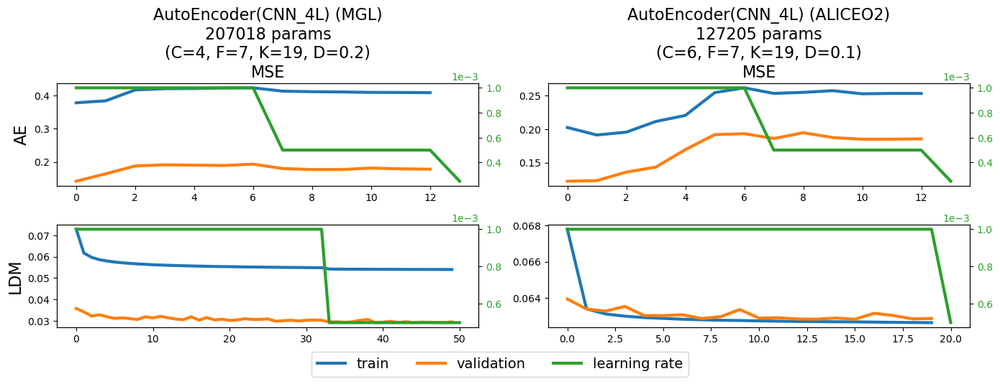

In [54]:
losses_plots_cnn = plot_losses_per_model(best_models_dict)

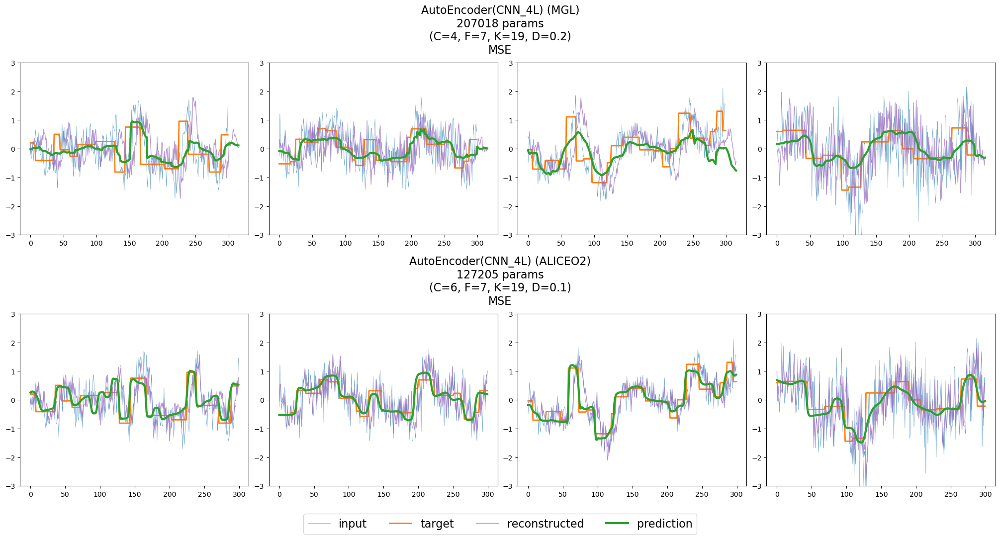

In [55]:
predictions_cnn = plot_predictions(best_models_dict, sim_data['test'])

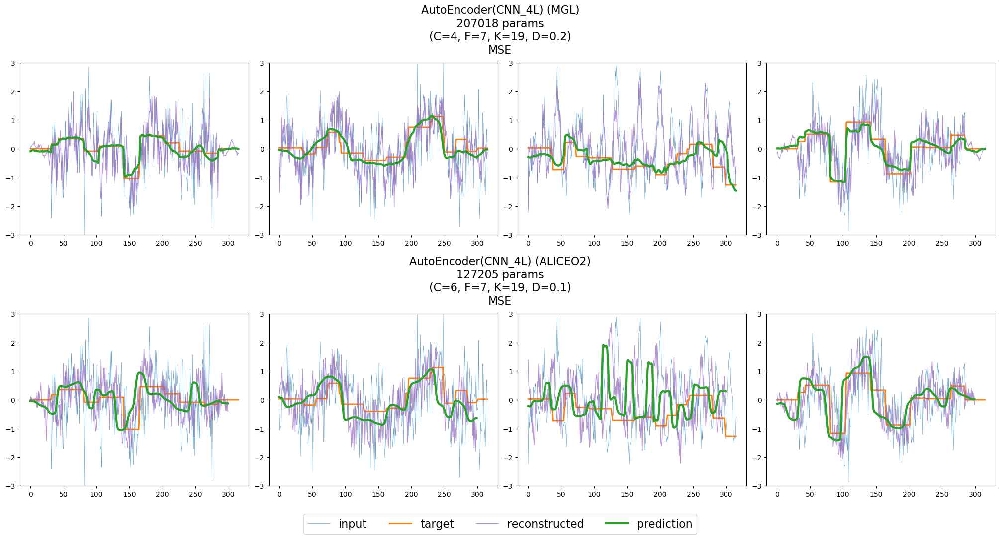

In [56]:
predictions_cnn = plot_predictions(best_models_dict, real_data['test'])

In [57]:
sim_loader = DataLoader(sim_data['test'])
real_loader = DataLoader(real_data['test'])
data_dict = {
    'simulated data': sim_loader,
    'real data': real_loader
}

for data_type, loader in data_dict.items():
    print('\n### inference on ', data_type, 'data ###\n')
    for model_infos in best_models_dict.values():
        model_name, model = model_infos[:2]
        mean, var = test_model(loader, model)
        print('\n', model_name)
        print('MSE = ', mean, ' +/- ', var)


### inference on  simulated data data ###


 AutoEncoder(CNN_4L) (MGL)
207018 params
(C=4, F=7, K=19, D=0.2)
MSE
MSE =  0.20117449760437012  +/-  0.008057213388383389

 AutoEncoder(CNN_4L) (ALICEO2)
127205 params
(C=6, F=7, K=19, D=0.1)
MSE
MSE =  0.08631572127342224  +/-  0.0022317986004054546

### inference on  real data data ###


 AutoEncoder(CNN_4L) (MGL)
207018 params
(C=4, F=7, K=19, D=0.2)
MSE
MSE =  0.06791289150714874  +/-  0.003155297599732876

 AutoEncoder(CNN_4L) (ALICEO2)
127205 params
(C=6, F=7, K=19, D=0.1)
MSE
MSE =  0.20204618573188782  +/-  0.0153849171474576


# Small models

In [5]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
lr = 0.001
batch_size = 64
stopping_params = {
    'num_epochs': 50,
    'patience': 12,
    'tolerance': 1e-4
}
criterion_params = {
    'alpha': 85.0,
    'lambda_tv': 0.0001
}
scheduler_params = {
    'patience': 5,
    'threshold': 1e-3,
    'factor': 0.5
}

def training_pipeline(model, dataset):

    train_loader = DataLoader(dataset['train'], batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(dataset['validation'], batch_size=batch_size, shuffle=True)

    criterion = blocky_loss(**criterion_params)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, **scheduler_params)
  
    output = train(
        model=model, 
        train_loader=train_loader,
        val_loader=val_loader,
        criterion=criterion,
        optimizer=optimizer,
        scheduler=scheduler,
        device=device,
        **stopping_params
    )
    
    return output

real_data = torch.load('datasets/real_data_MGL_080808.pt')
sim_data = torch.load('datasets/simulated_data_aliceO2_1M.pt')

In [6]:
model_sim = CNN_3l(13, 13, 13, 10, 10).to(device)
model_real = CNN_3l(13, 13, 13, 10, 10).to(device)

small_models_dict = {}

output_real = training_pipeline(model_real, real_data)
output_sim = training_pipeline(model_sim, sim_data)

Epoch 0: train_loss = 0.1146697830546238 | val_loss = 0.09429474103156918 | lr = 0.001
Epoch 1: train_loss = 0.11225152552387914 | val_loss = 0.0933508262520682 | lr = 0.001
Epoch 2: train_loss = 0.11162775247839886 | val_loss = 0.09345564311418225 | lr = 0.001
Epoch 3: train_loss = 0.11129528840103116 | val_loss = 0.09312448074946604 | lr = 0.001
Epoch 4: train_loss = 0.11113240093063713 | val_loss = 0.09220386013618895 | lr = 0.001
Epoch 5: train_loss = 0.11098515861850558 | val_loss = 0.09210828792597109 | lr = 0.001
Epoch 6: train_loss = 0.11088846766170837 | val_loss = 0.09126982381779802 | lr = 0.001
Epoch 7: train_loss = 0.11081656388870452 | val_loss = 0.09096171739261058 | lr = 0.001
Epoch 8: train_loss = 0.11076491356770797 | val_loss = 0.09132118785727805 | lr = 0.001
Epoch 9: train_loss = 0.11071578070716412 | val_loss = 0.09152979797918714 | lr = 0.001
Epoch 10: train_loss = 0.11068835769887483 | val_loss = 0.09251388333425353 | lr = 0.001
Epoch 11: train_loss = 0.11068246

In [7]:
small_models_dict['real'] = ['CNN-small (real)', model_real, output_real]
small_models_dict['simulated'] = ['CNN-small (simulated)', model_sim, output_sim]

pickle_dump(small_models_dict, f'final_models/cnn_small.pkl')

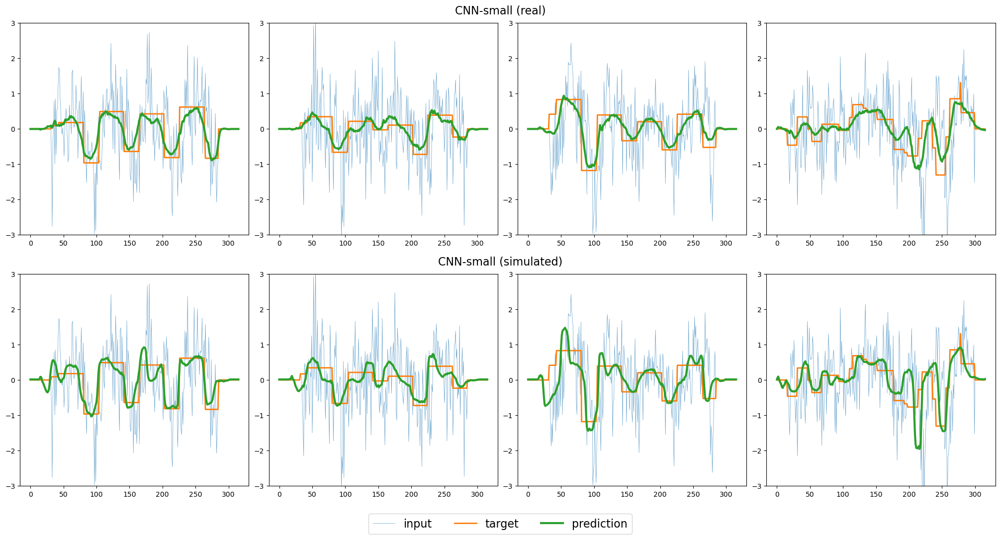

In [8]:
f_real = plot_predictions(small_models_dict, real_data['test'])

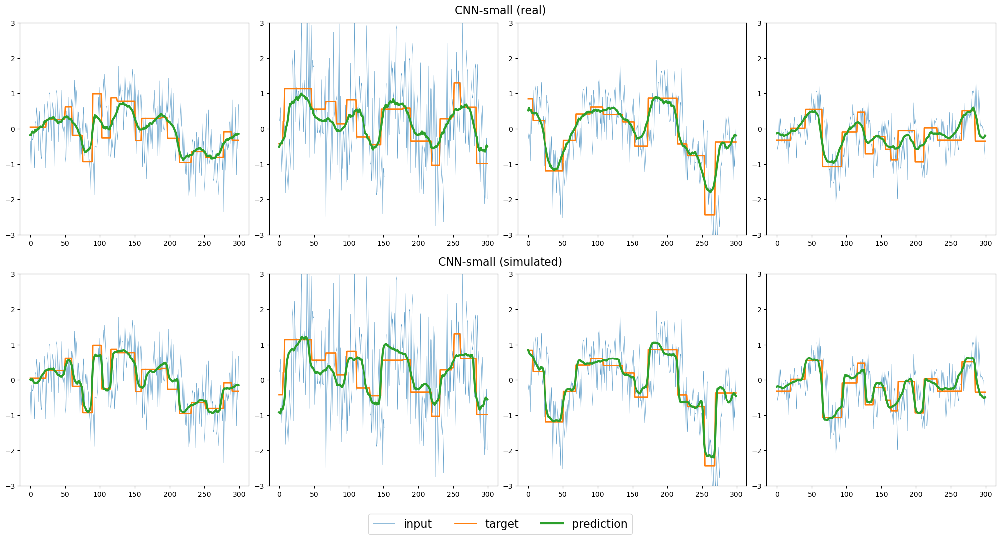

In [9]:
f_sim = plot_predictions(small_models_dict, sim_data['test'])

In [10]:
test_data = {'real': real_data['test'], 'simulated': sim_data['test']}

cnn_small_test_df_dict = {}
for data_type, dataset in tqdm(test_data.items()):
    cnn_small_test_df_dict[data_type] = compute_test_metric(small_models_dict, dataset, device="cpu")

100%|█████████████████████████████████████████████| 2/2 [00:14<00:00,  7.18s/it]


In [11]:
def format_test_df(data_dict):
    renamed_dfs = []
    for key, df in data_dict.items():
        renamed = df.rename(columns={"metric": f"MSE ({key})", "var": f"var ({key})"})
        renamed_dfs.append(renamed)

    # Merge all dataframes on the 'model' column
    master_df = renamed_dfs[0]
    for df in renamed_dfs[1:]:
        master_df = master_df.merge(df, on="model", how="outer")
    
    master_df['pretraining_dataset'] = master_df['model'].str.contains('real').map({True: 'real', False: 'simulated'})
    master_df = master_df.sort_values(by='pretraining_dataset', ascending=True)
    master_df['model'] = master_df['model'].str.replace(r'\s*\(real\)', '', regex=True)
    master_df['model'] = master_df['model'].str.replace(r'\s*\(simulated\)', '', regex=True)
    master_df.set_index(['pretraining_dataset', 'model'], inplace=True)
    master_df.index.names = ['Pretraining dataset', 'Model']

    # pairs = [
    #     ('MSE (simulated)', 'var (simulated)'),
    #     ('MSE (real)', 'var (real)'),
    #     ('MSE (motor)', 'var (motor)'),
    #     ('MSE (language)', 'var (language)'),
    #     ('MSE (gambling)', 'var (gambling)'),
    #     ('MSE (emotion)', 'var (emotion)'),
    #     ('MSE (wm)', 'var (wm)')
    # ]

    # # Overwrite MSE columns with formatted string
    # for mse_col, var_col in pairs:
    #     master_df[mse_col] = master_df.apply(lambda row: f"{row[mse_col]:.4f} ± {row[var_col]:.4f}", axis=1)
    # master_df = master_df.drop(columns=[var for _, var in pairs])

    return master_df
format_test_df(cnn_small_test_df_dict)

,,MSE (real),var (real),MSE (simulated),var (simulated)
Pretraining dataset,Model,,,,
real,CNN-small,0.092632,0.000959,0.094432,0.000029
simulated,CNN-small,0.148022,0.002969,0.063753,0.000021
